James Mackey Jr

HW4

Dr. Forouraghi

Generative AI

November 5, 2024

### Setup

In [ ]:
import tensorflow as tf

In [ ]:
tf.__version__

'2.15.0'

In [ ]:
# To generate GIFs
!pip install imageio
!pip install git+https://github.com/tensorflow/docs

  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-xlmcdbdt
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/docs /tmp/pip-req-build-xlmcdbdt
  Resolved https://github.com/tensorflow/docs to commit 15e96c3ee154d7c10ec9bb807ef44b4e6f08e65b
  Preparing metadata (setup.py) ... done
  Created wheel for tensorflow-docs: filename=tensorflow_docs-2024.10.14.18741-py3-none-any.whl size=182607 sha256=2cb2209540ba625f53ac41a7dec44b614049625d468054ef3cba2aceb16ffe3a
  Stored in directory: /tmp/pip-ephem-wheel-cache-1xu_28nv/wheels/86/0f/1e/3b62293c8ffd0fd5a49508e6871cdb7554abe9c62afd35ec53
Successfully built tensorflow-docs


In [ ]:
import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
from tensorflow.keras import layers
import time
from sklearn.model_selection import train_test_split
from IPython import display
import pathlib
from pathlib import Path
import zipfile
from PIL import Image

### Load and prepare the dataset

You will use the MNIST dataset to train the generator and the discriminator. The generator will generate handwritten digits resembling the MNIST data.

In [ ]:
import kagglehub

!pip install patool

!apt-get install p7zip-full  # Make sure you have p7zip-full for better compatibility


import patoolib

import os

import requests

!pip install kaggle
!kaggle datasets download -d jhoward/lsun_bedroom -p dataset --unzip


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.3/98.3 kB 1.9 MB/s eta 0:00:00
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
p7zip-full is already the newest version (16.02+dfsg-8).
0 upgraded, 0 newly installed, 0 to remove and 0 not upgraded.
Dataset URL: https://www.kaggle.com/datasets/jhoward/lsun_bedroom
License(s): ODbL-1.0
100% 8.89G/8.89G [01:33<00:00, 121MB/s]
100% 8.89G/8.89G [01:33<00:00, 103MB/s]


In [ ]:
# Set up directories
input_dir = "dataset"
output_dir = "preprocessed_dataset"
os.makedirs(output_dir, exist_ok=True)

# Define image preprocessing steps
preprocess = transforms.Compose([
    transforms.Resize((128, 128)),  # Resize to 128x128 pixels
    transforms.ToTensor(),          # Convert to tensor with channels first (C, H, W)
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize
])

# List to hold paths of all images
all_image_paths = []

# Use os.walk to gather all image paths recursively
for root, dirs, files in os.walk(input_dir):
    for img_name in files:
        if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
            img_path = os.path.join(root, img_name)
            all_image_paths.append(img_path)

# Randomly sample 5000 image paths, or use all if fewer than 5000
if len(all_image_paths) > 5000:
    sampled_image_paths = random.sample(all_image_paths, 5000)
else:
    sampled_image_paths = all_image_paths
print(f"Processing {len(sampled_image_paths)} images.")

# List to hold preprocessed images
images_array = []

# Process the sampled images
for img_path in tqdm(sampled_image_paths):
    try:
        # Open and preprocess image
        with Image.open(img_path) as img:
            img = img.convert("RGB")  # Convert to RGB
            img = preprocess(img)     # Apply transformations

            # De-normalize the image back to [0, 1] range for storage
            img = img * 0.5 + 0.5

            # Convert tensor to numpy array in (128, 128, 3) format
            img_np = img.permute(1, 2, 0).numpy()  # Rearrange dimensions to (H, W, C)
            images_array.append(img_np)

            # Save the image back as a PIL image
            output_path = os.path.join(output_dir, os.path.basename(img_path))
            transforms.ToPILImage()(img).save(output_path)

    except Exception as e:
        print(f"Could not process {img_path}: {e}")

# Convert the list to a NumPy array for easy handling
images_array = np.array(images_array)

# Check the shape of the array
print(f"Shape of images_array: {images_array.shape}")
print(f"Subset of images has been preprocessed, saved to {output_dir}, and stored in a NumPy array.")


Processing 5000 images.


100%|██████████| 5000/5000 [00:17<00:00, 290.34it/s]


Shape of images_array: (5000, 128, 128, 3)
Subset of images has been preprocessed, saved to preprocessed_dataset, and stored in a NumPy array.


In [ ]:

EPOCHS = 50
BATCH_SIZE = 256
noise_dim = 100
num_examples_to_generate = 16
BUFFER_SIZE = 60000

In [ ]:
# Batch and shuffle the data
# train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

## Create the models

Both the generator and discriminator are defined using the [Keras Sequential API](https://www.tensorflow.org/guide/keras#sequential_model).

### The Generator

The generator uses `tf.keras.layers.Conv2DTranspose` (upsampling) layers to produce an image from a seed (random noise). Start with a `Dense` layer that takes this seed as input, then upsample several times until you reach the desired image size of 28x28x1. Notice the `tf.keras.layers.LeakyReLU` activation for each layer, except the output layer which uses tanh.

In [ ]:
def make_generator_model():
    model = tf.keras.Sequential()

    # Dense layer to expand from noise vector to 8x8x256 tensor
    model.add(layers.Dense(8 * 8 * 256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Reshape to start the convolutional layers
    model.add(layers.Reshape((8, 8, 256)))

    # First Conv2DTranspose layer: Upsample to 16x16
    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Second Conv2DTranspose layer: Upsample to 32x32
    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Third Conv2DTranspose layer: Upsample to 64x64
    model.add(layers.Conv2DTranspose(32, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Final Conv2DTranspose layer: Upsample to 128x128x3 with tanh activation for RGB output
    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', activation='tanh'))

    return model

Use the (as yet untrained) generator to create an image.

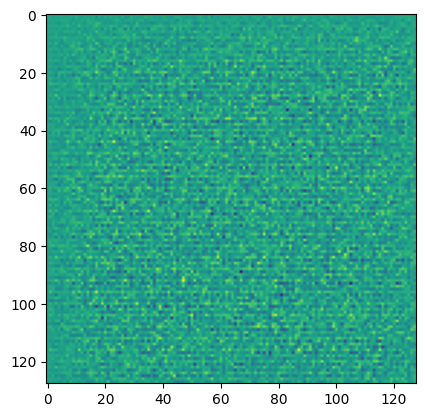

In [ ]:
generator = make_generator_model()

noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0])

### The Discriminator

The discriminator is a CNN-based image classifier.

In [ ]:
def make_discriminator_model():
    model = tf.keras.Sequential()

    # Update input shape to match generated images (128x128 RGB)
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[128, 128, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))  # Binary output for real/fake classification

    return model


Use the (as yet untrained) discriminator to classify the generated images as real or fake. The model will be trained to output positive values for real images, and negative values for fake images.

In [ ]:
discriminator = make_discriminator_model()
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[0.0007831]], shape=(1, 1), dtype=float32)


## Define the loss and optimizers

Define loss functions and optimizers for both models.


In [ ]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)


## Define the training loop


In [ ]:
# Seed to visualize progress
seed = tf.random.normal([num_examples_to_generate, noise_dim])

In [ ]:
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
# Training step for one batch
@tf.function
def train_step(images, noise): # Accept noise as an argument
    #noise = tf.random.normal([BATCH_SIZE, noise_dim]) # Remove this line

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # Generate images from random noise
        generated_images = generator(noise, training=True)

        # Get discriminator's predictions for real and fake images
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        # Calculate generator and discriminator losses
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    # Calculate gradients for both generator and discriminator
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    # Apply gradients to optimize both models
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    # Return generator and discriminator losses
    return gen_loss, disc_loss

Epoch 1/50, Generator Loss: 3.9122352600097656, Discriminator Loss: 0.17439715564250946
Time for Epoch 1: 212.98 seconds
Estimated time remaining: 173.94 minutes


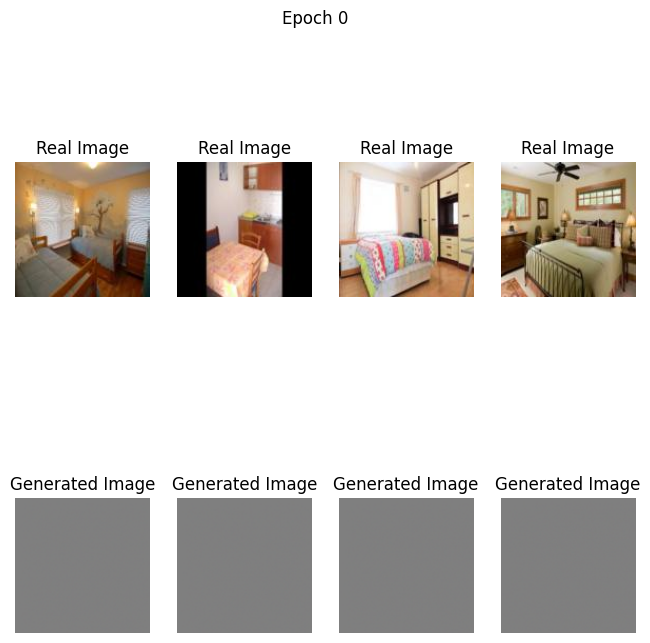

Epoch 2/50, Generator Loss: 9.233060836791992, Discriminator Loss: 0.47260531783103943
Time for Epoch 2: 211.07 seconds
Estimated time remaining: 168.85 minutes


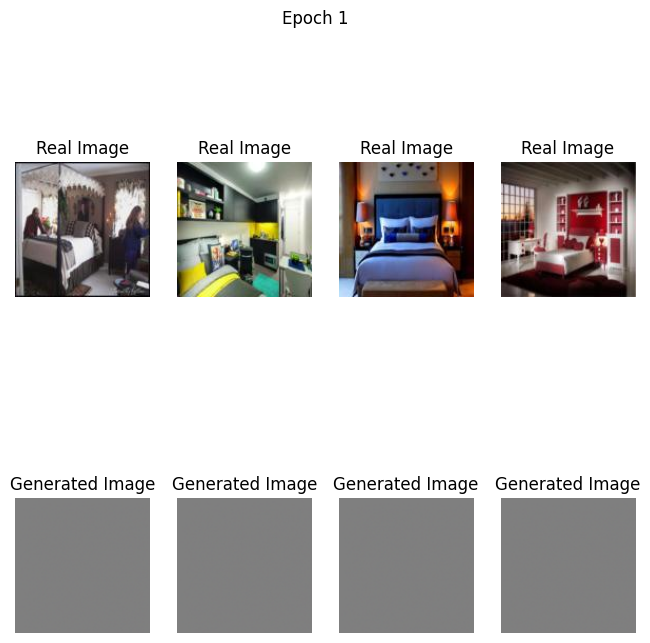

Epoch 3/50, Generator Loss: 6.023134231567383, Discriminator Loss: 0.11221446841955185
Time for Epoch 3: 210.79 seconds
Estimated time remaining: 165.12 minutes


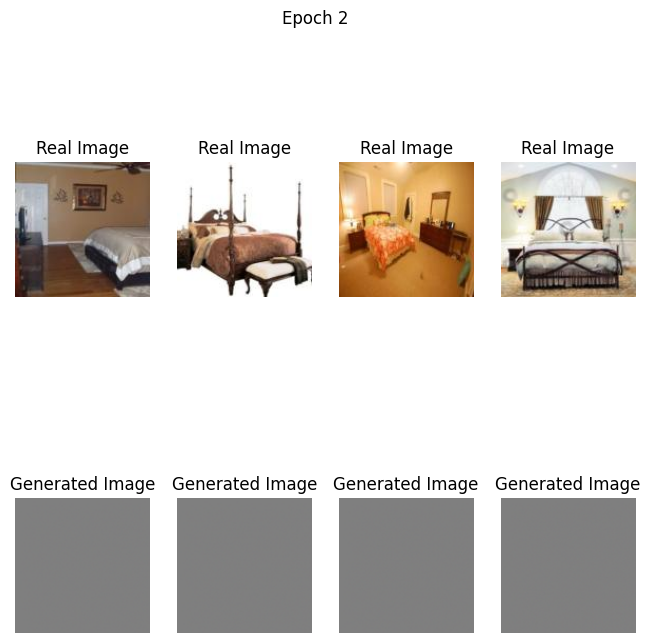

Epoch 4/50, Generator Loss: 4.766000747680664, Discriminator Loss: 0.10714244842529297
Time for Epoch 4: 214.33 seconds
Estimated time remaining: 164.32 minutes


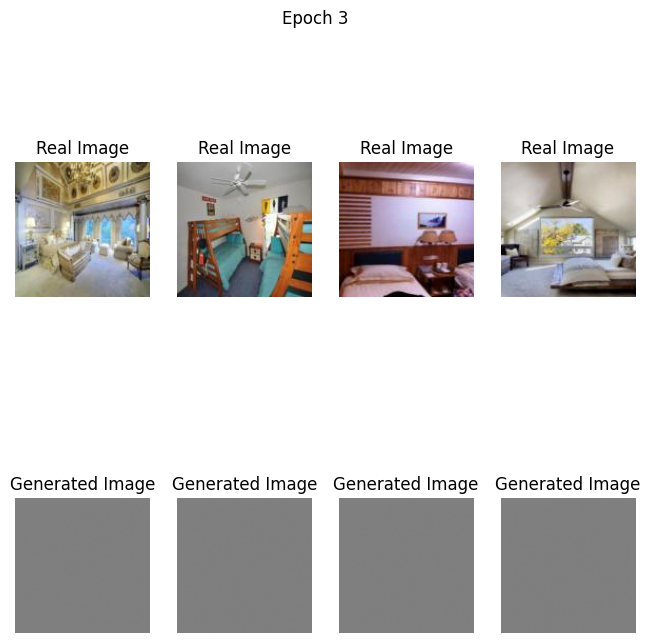

Epoch 5/50, Generator Loss: 6.896085262298584, Discriminator Loss: 0.3614952564239502
Time for Epoch 5: 209.86 seconds
Estimated time remaining: 157.40 minutes


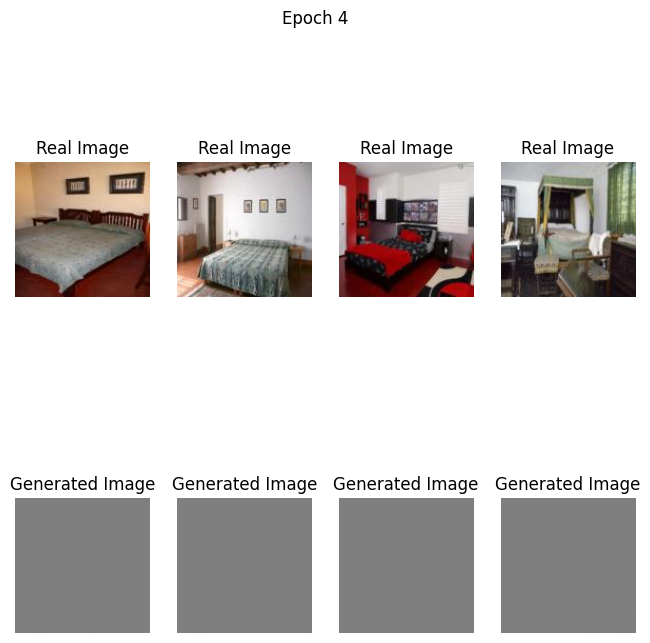

Epoch 6/50, Generator Loss: 6.92109489440918, Discriminator Loss: 0.5066770911216736
Time for Epoch 6: 211.06 seconds
Estimated time remaining: 154.78 minutes


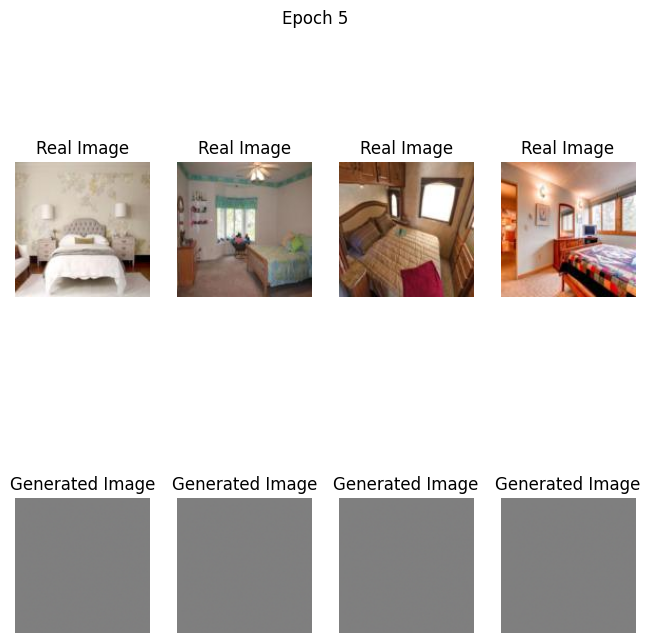

Epoch 7/50, Generator Loss: 5.628627777099609, Discriminator Loss: 0.2409486472606659
Time for Epoch 7: 210.11 seconds
Estimated time remaining: 150.58 minutes


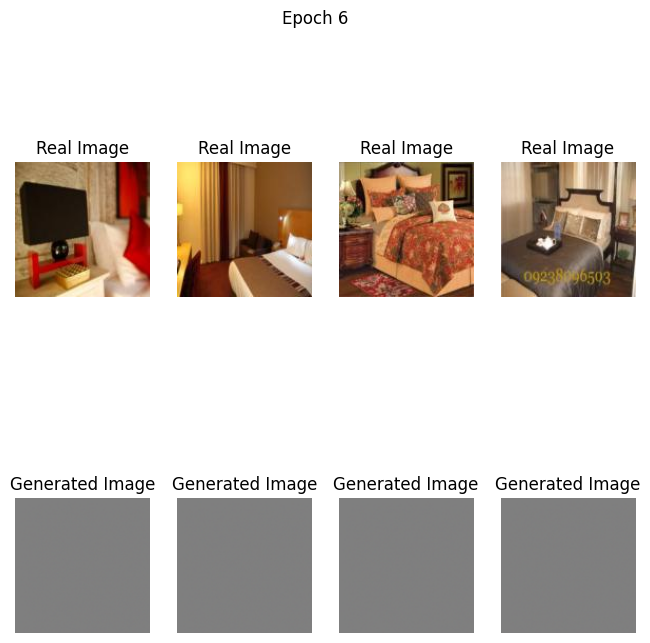

Epoch 8/50, Generator Loss: 7.427781105041504, Discriminator Loss: 0.11782030761241913
Time for Epoch 8: 211.86 seconds
Estimated time remaining: 148.30 minutes


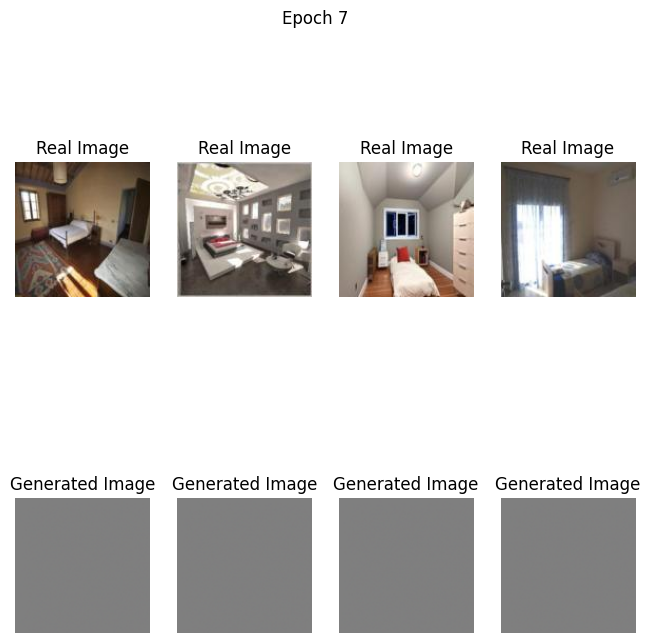

Epoch 9/50, Generator Loss: 3.42633056640625, Discriminator Loss: 0.6045190691947937
Time for Epoch 9: 208.93 seconds
Estimated time remaining: 142.77 minutes


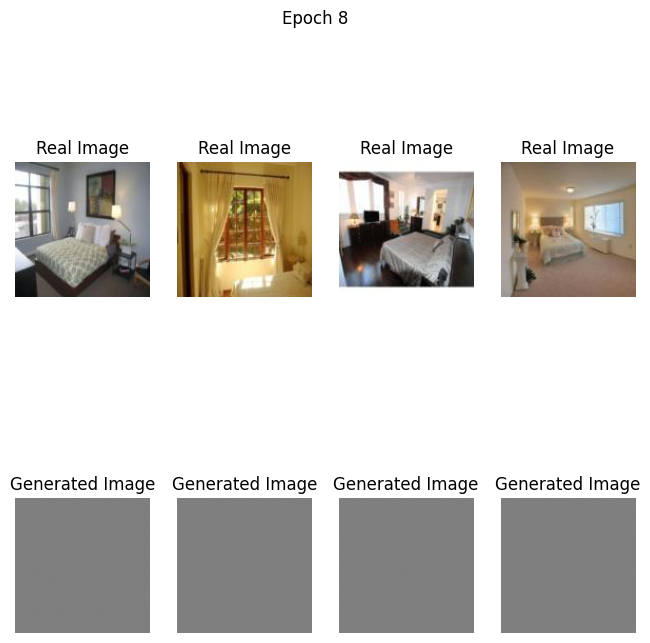

Epoch 10/50, Generator Loss: 4.177103042602539, Discriminator Loss: 0.22877636551856995
Time for Epoch 10: 209.23 seconds
Estimated time remaining: 139.49 minutes


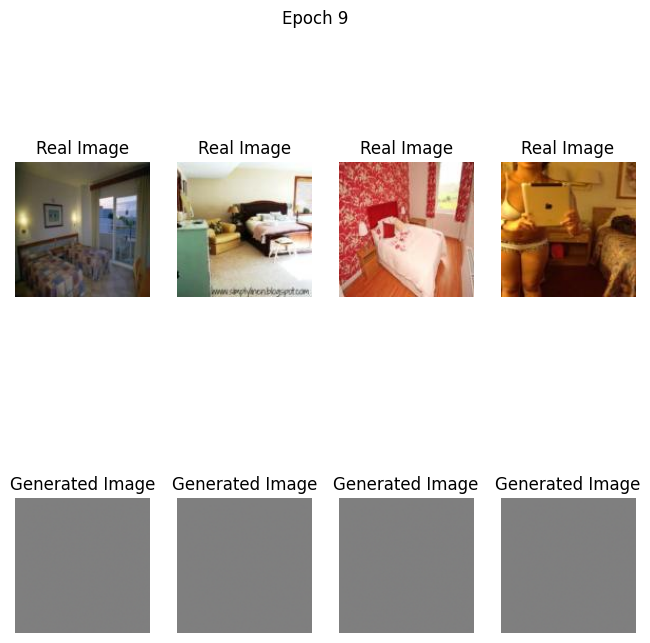

Epoch 11/50, Generator Loss: 2.4410088062286377, Discriminator Loss: 0.5291426181793213
Time for Epoch 11: 213.60 seconds
Estimated time remaining: 138.84 minutes


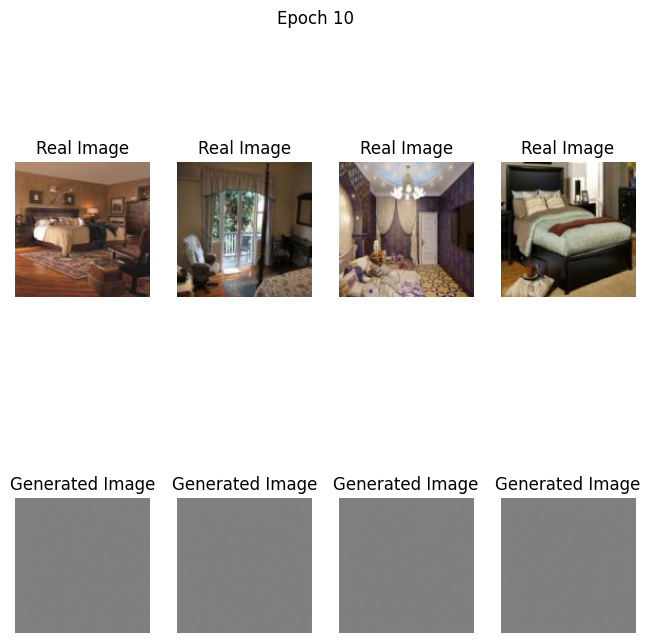

Epoch 12/50, Generator Loss: 3.438593864440918, Discriminator Loss: 0.15125896036624908
Time for Epoch 12: 214.11 seconds
Estimated time remaining: 135.60 minutes


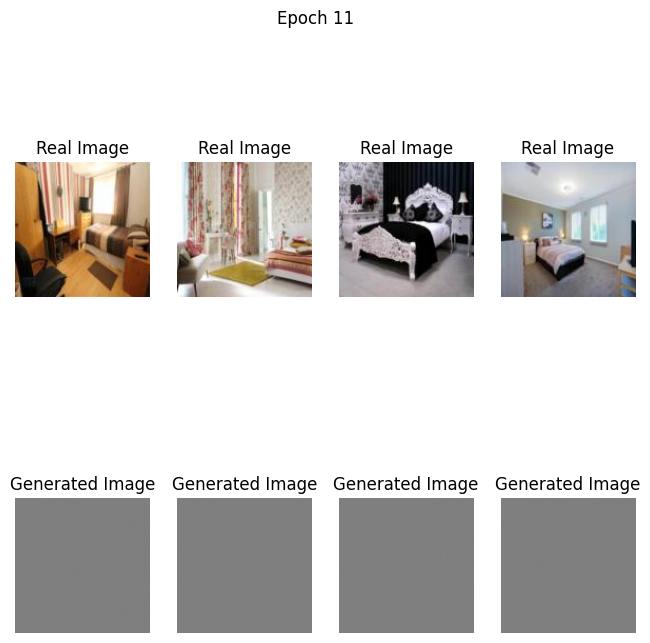

Epoch 13/50, Generator Loss: 3.1131932735443115, Discriminator Loss: 0.3159307837486267
Time for Epoch 13: 210.70 seconds
Estimated time remaining: 129.93 minutes


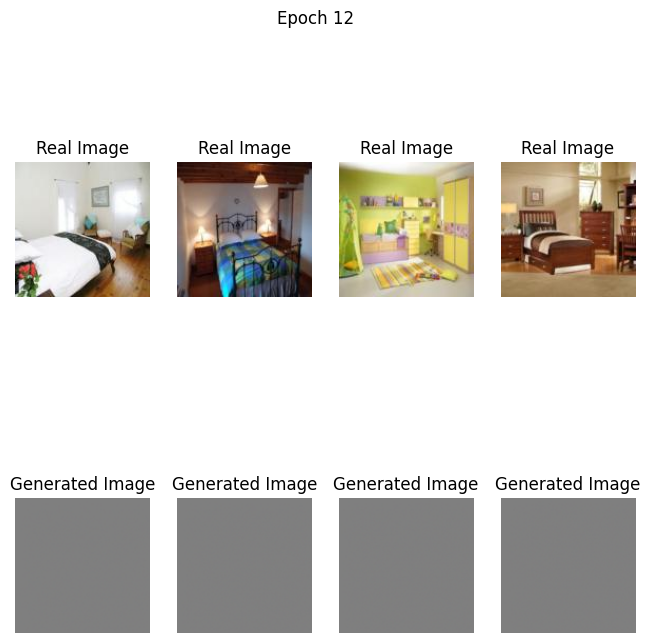

Epoch 14/50, Generator Loss: 5.865118980407715, Discriminator Loss: 0.09703142940998077
Time for Epoch 14: 210.90 seconds
Estimated time remaining: 126.54 minutes


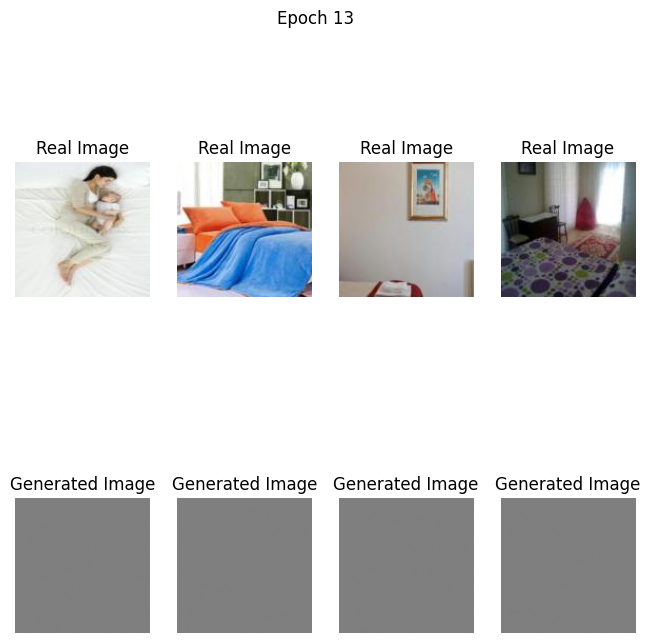

Epoch 15/50, Generator Loss: 3.99943208694458, Discriminator Loss: 0.4891033172607422
Time for Epoch 15: 212.79 seconds
Estimated time remaining: 124.13 minutes


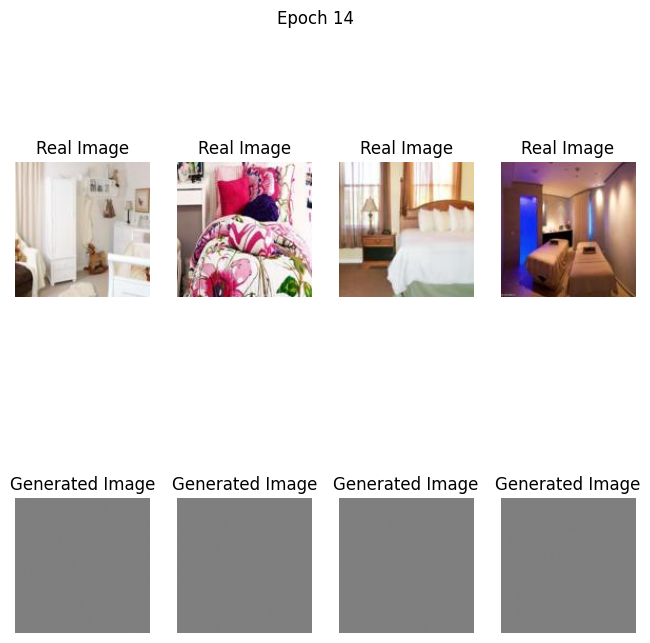

Epoch 16/50, Generator Loss: 5.483141899108887, Discriminator Loss: 0.22162149846553802
Time for Epoch 16: 212.97 seconds
Estimated time remaining: 120.68 minutes


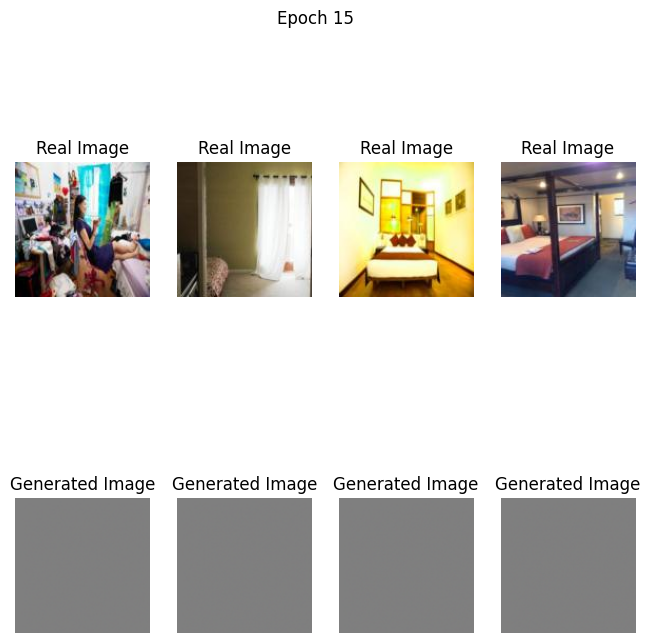

Epoch 17/50, Generator Loss: 4.623299598693848, Discriminator Loss: 0.09383556246757507
Time for Epoch 17: 211.19 seconds
Estimated time remaining: 116.16 minutes


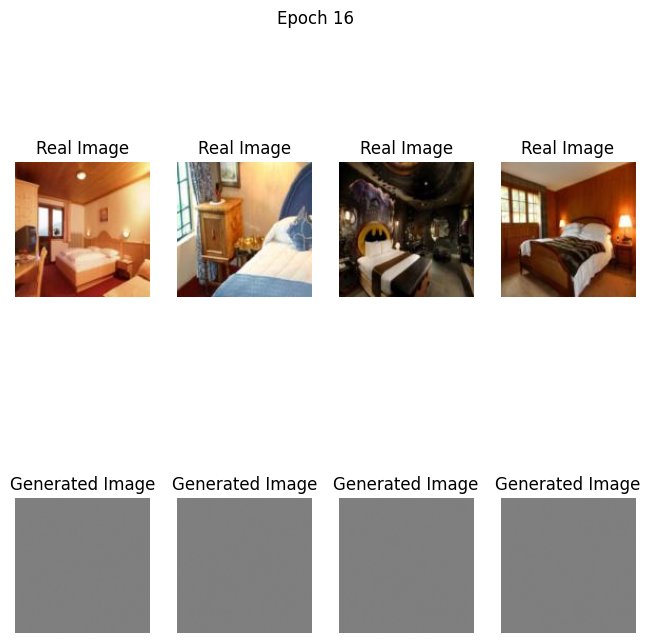

Epoch 18/50, Generator Loss: 3.489403247833252, Discriminator Loss: 0.28001320362091064
Time for Epoch 18: 212.65 seconds
Estimated time remaining: 113.41 minutes


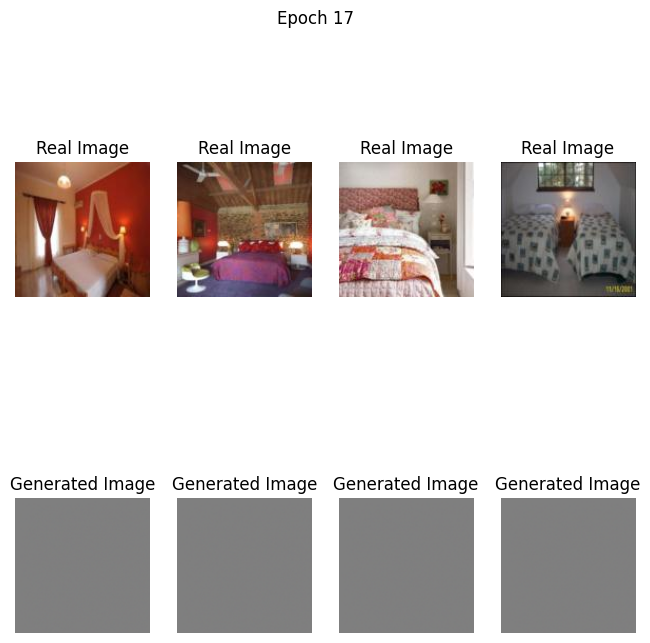

Epoch 19/50, Generator Loss: 3.9247243404388428, Discriminator Loss: 0.4200999140739441
Time for Epoch 19: 214.36 seconds
Estimated time remaining: 110.75 minutes


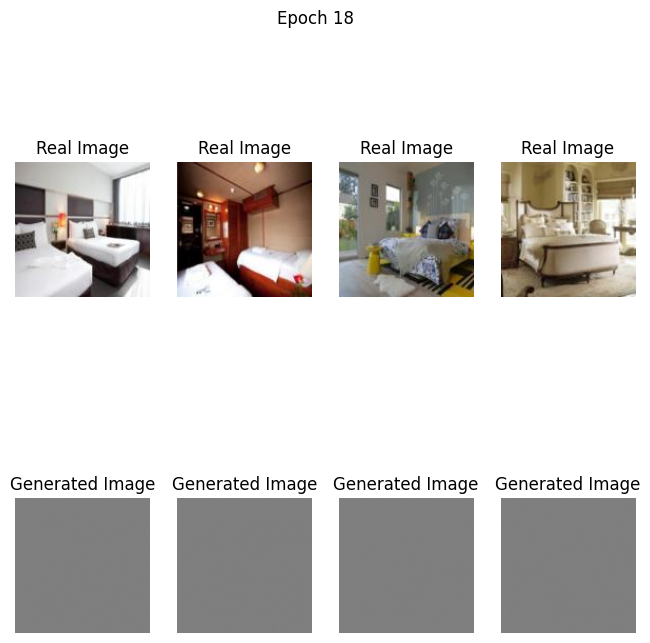

Epoch 20/50, Generator Loss: 3.5777082443237305, Discriminator Loss: 0.16091133654117584
Time for Epoch 20: 209.18 seconds
Estimated time remaining: 104.59 minutes


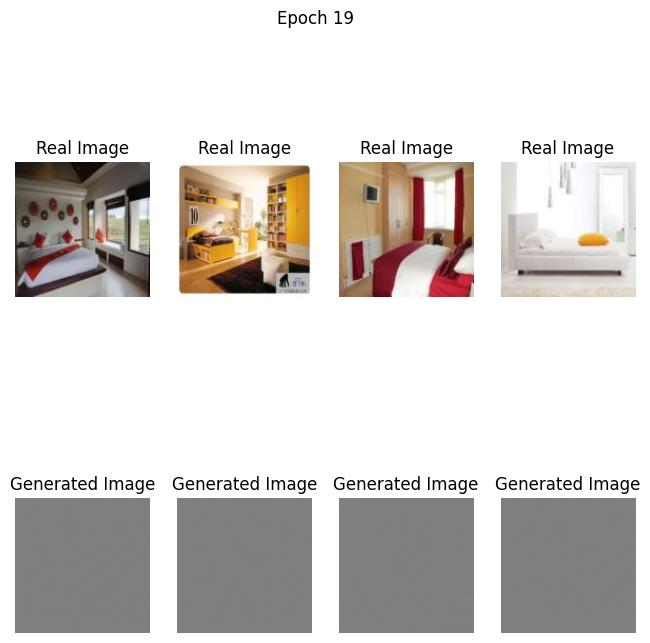

Epoch 21/50, Generator Loss: 3.3271145820617676, Discriminator Loss: 0.2346014529466629
Time for Epoch 21: 210.12 seconds
Estimated time remaining: 101.56 minutes


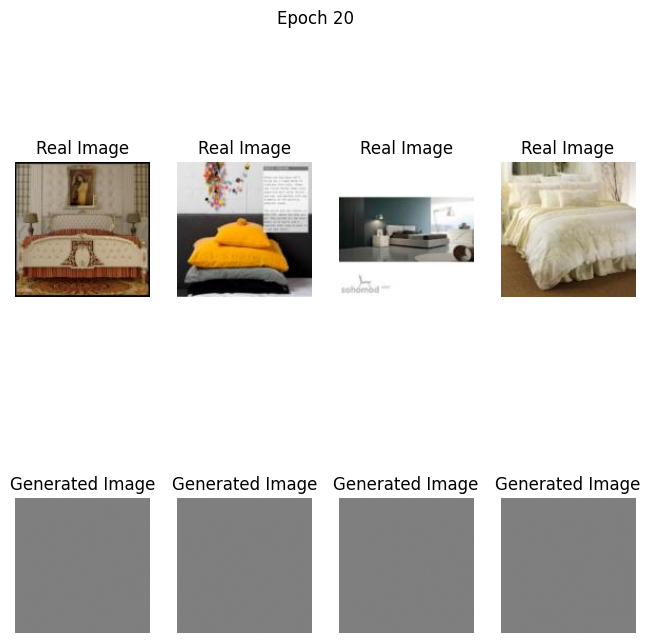

Epoch 22/50, Generator Loss: 12.589439392089844, Discriminator Loss: 0.04885312542319298
Time for Epoch 22: 210.24 seconds
Estimated time remaining: 98.11 minutes


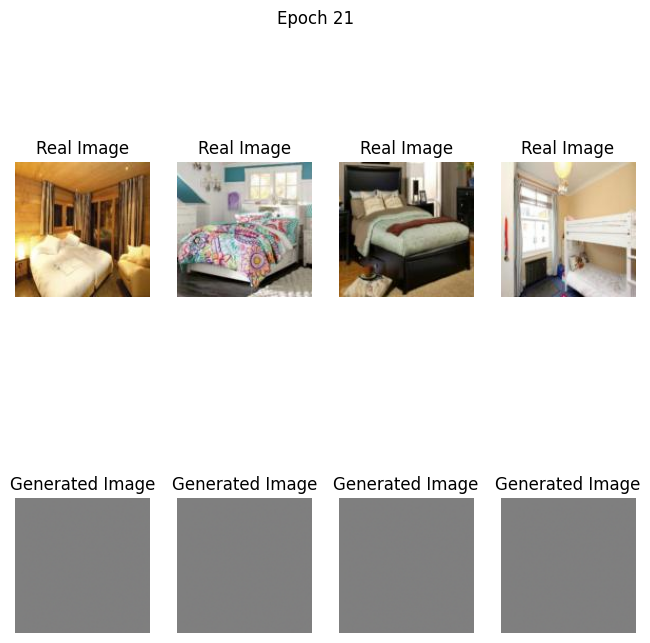

Epoch 23/50, Generator Loss: 3.721369981765747, Discriminator Loss: 0.17541395127773285
Time for Epoch 23: 210.34 seconds
Estimated time remaining: 94.65 minutes


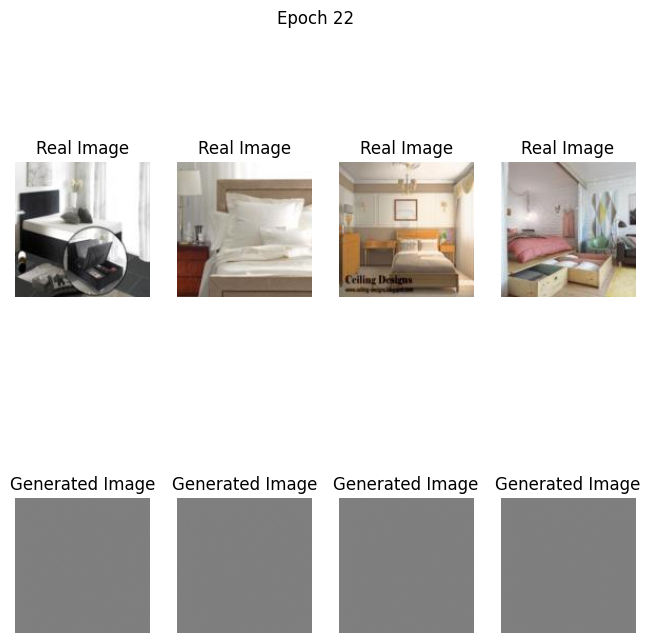

Epoch 24/50, Generator Loss: 3.0136332511901855, Discriminator Loss: 0.2940250635147095
Time for Epoch 24: 211.59 seconds
Estimated time remaining: 91.69 minutes


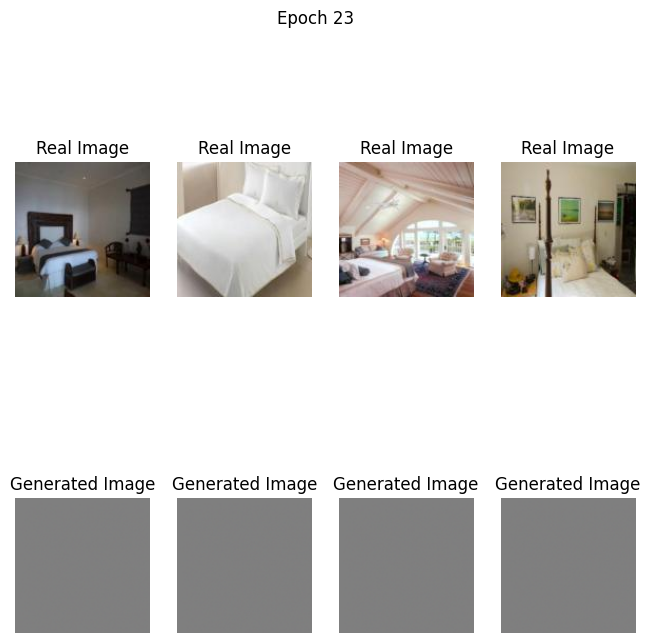

Epoch 25/50, Generator Loss: 4.43814754486084, Discriminator Loss: 0.11595992743968964
Time for Epoch 25: 213.09 seconds
Estimated time remaining: 88.79 minutes


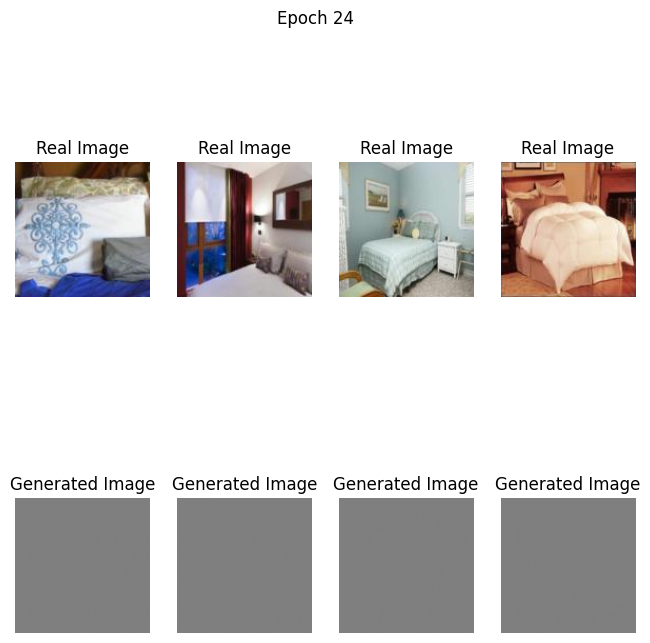

Epoch 26/50, Generator Loss: 3.698309898376465, Discriminator Loss: 0.20762334764003754
Time for Epoch 26: 211.74 seconds
Estimated time remaining: 84.69 minutes


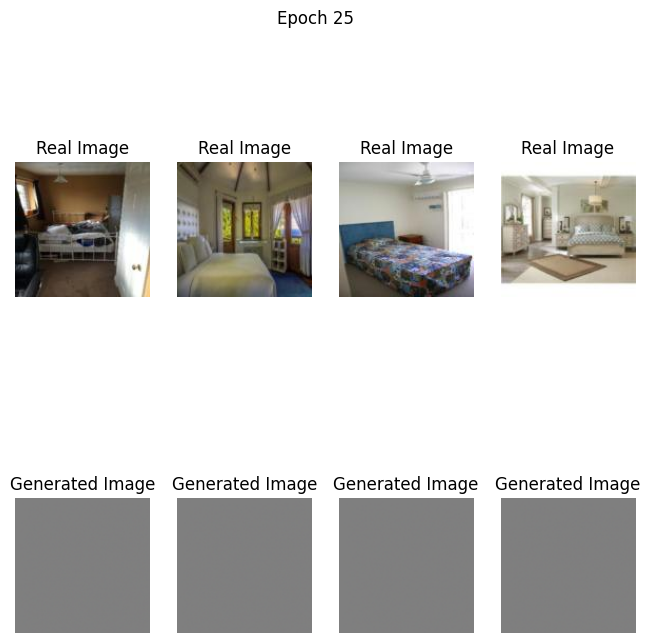

Epoch 27/50, Generator Loss: 4.105230331420898, Discriminator Loss: 0.1506837159395218
Time for Epoch 27: 211.93 seconds
Estimated time remaining: 81.24 minutes


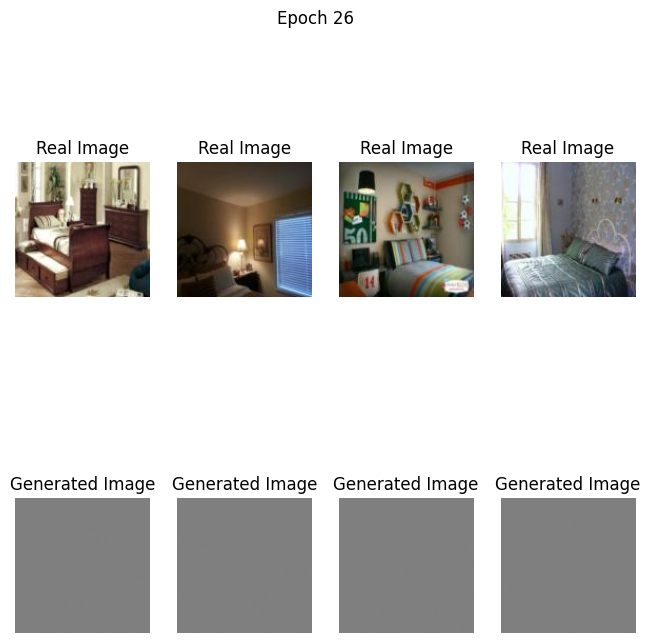

Epoch 28/50, Generator Loss: 5.071261405944824, Discriminator Loss: 0.4347764849662781
Time for Epoch 28: 212.53 seconds
Estimated time remaining: 77.93 minutes


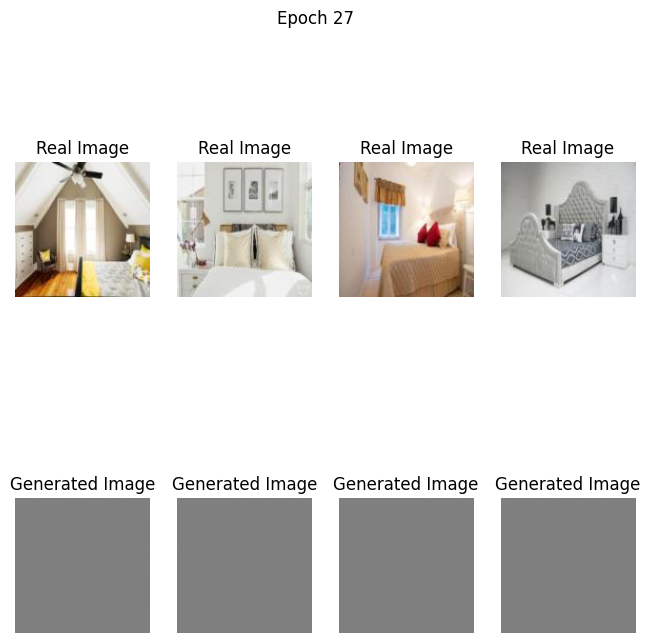

Epoch 29/50, Generator Loss: 5.727971076965332, Discriminator Loss: 0.09743627905845642
Time for Epoch 29: 210.74 seconds
Estimated time remaining: 73.76 minutes


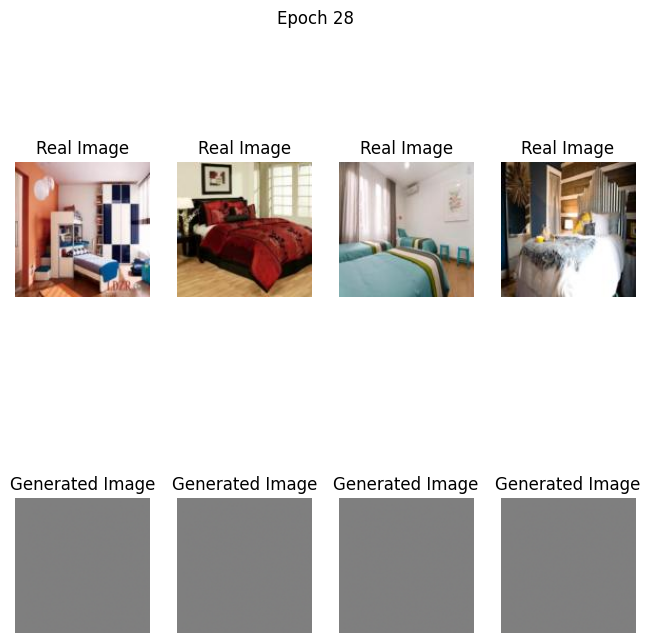

Epoch 30/50, Generator Loss: 3.9258079528808594, Discriminator Loss: 0.2574787139892578
Time for Epoch 30: 213.74 seconds
Estimated time remaining: 71.25 minutes


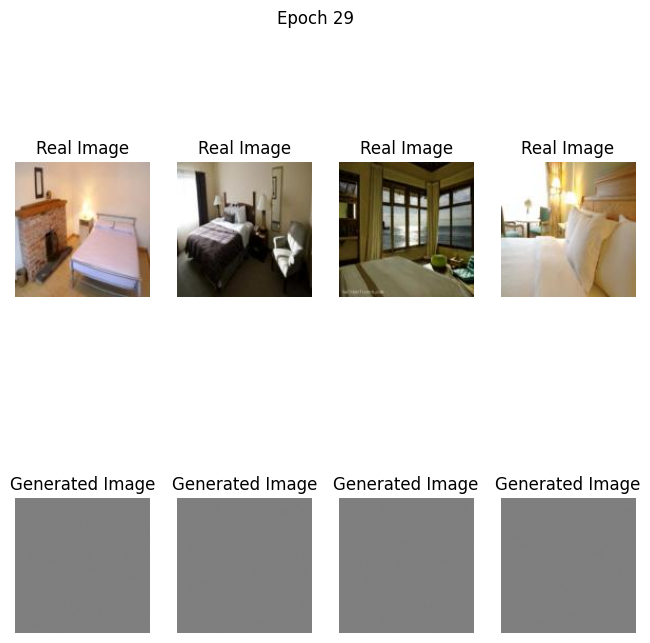

Epoch 31/50, Generator Loss: 3.9400625228881836, Discriminator Loss: 0.20641270279884338
Time for Epoch 31: 210.15 seconds
Estimated time remaining: 66.55 minutes


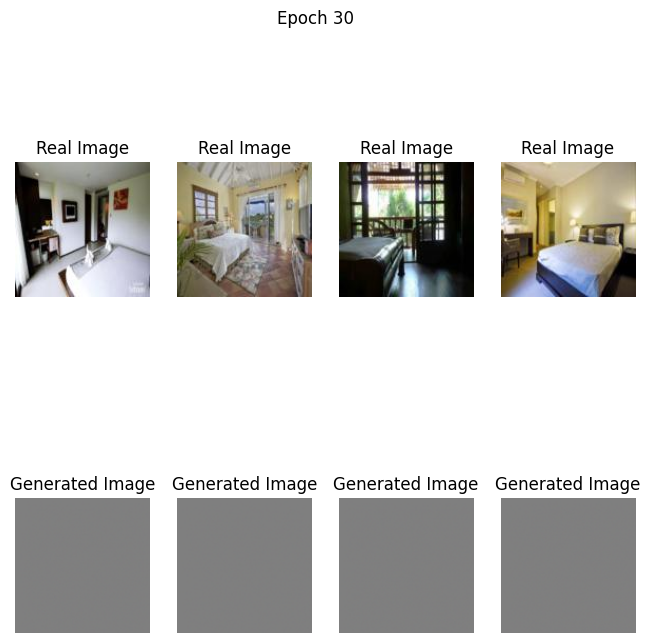

Epoch 32/50, Generator Loss: 2.1904664039611816, Discriminator Loss: 1.0093801021575928
Time for Epoch 32: 210.56 seconds
Estimated time remaining: 63.17 minutes


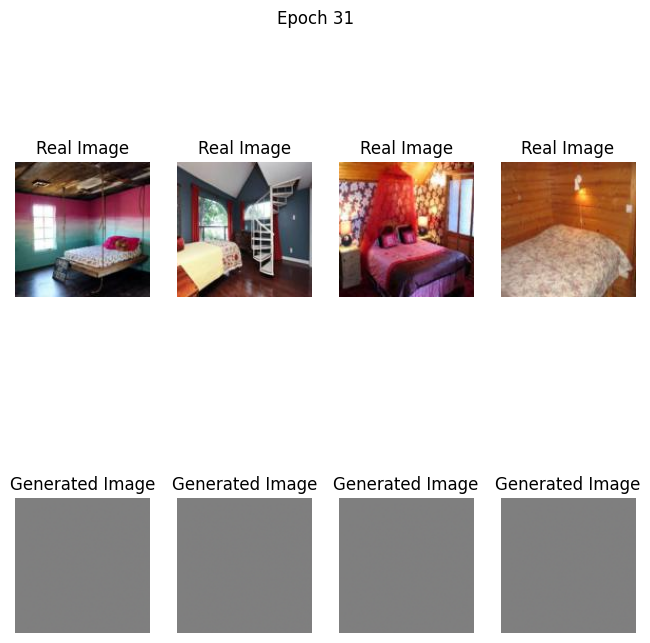

Epoch 33/50, Generator Loss: 4.326815605163574, Discriminator Loss: 0.13161222636699677
Time for Epoch 33: 212.36 seconds
Estimated time remaining: 60.17 minutes


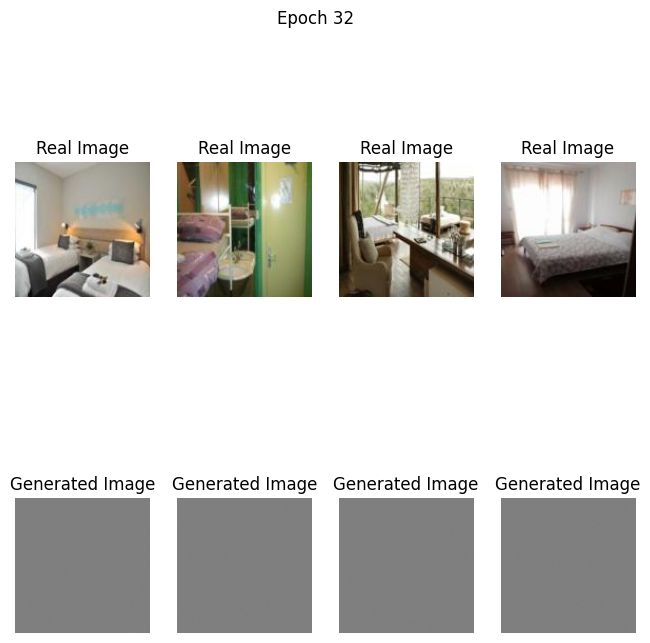

Epoch 34/50, Generator Loss: 4.233536243438721, Discriminator Loss: 0.1656741350889206
Time for Epoch 34: 213.02 seconds
Estimated time remaining: 56.80 minutes


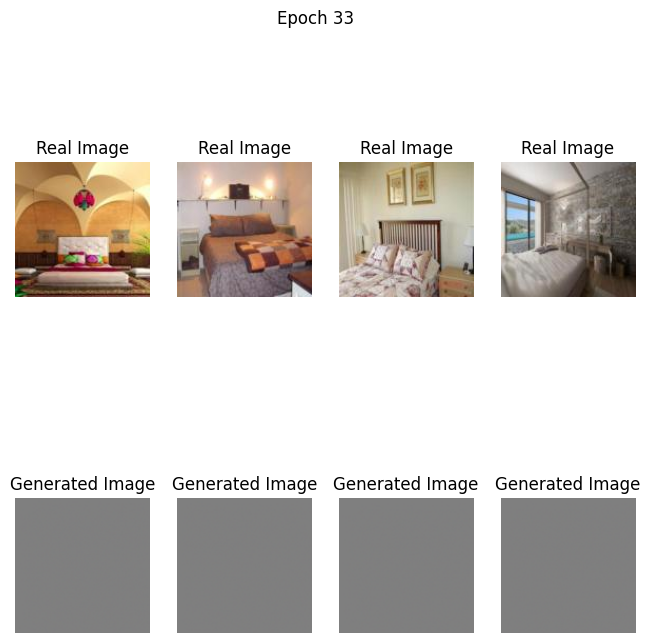

Epoch 35/50, Generator Loss: 3.102102279663086, Discriminator Loss: 0.4075222611427307
Time for Epoch 35: 213.18 seconds
Estimated time remaining: 53.29 minutes


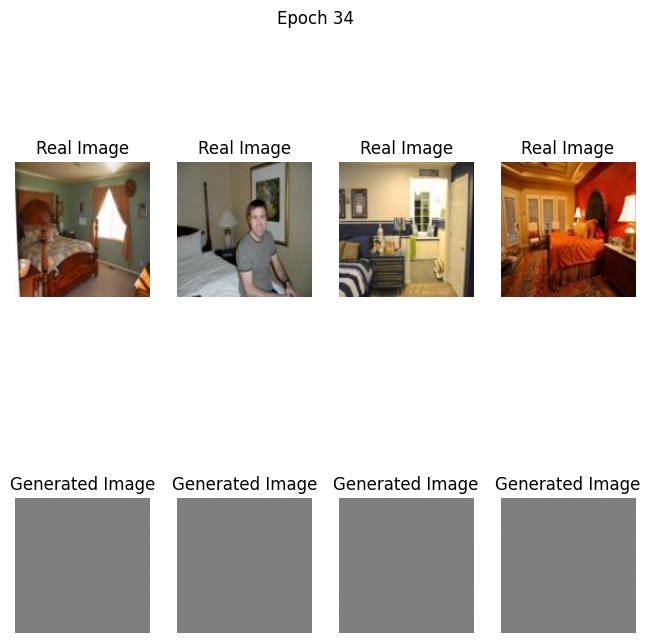

Epoch 36/50, Generator Loss: 3.8007307052612305, Discriminator Loss: 0.17271879315376282
Time for Epoch 36: 215.14 seconds
Estimated time remaining: 50.20 minutes


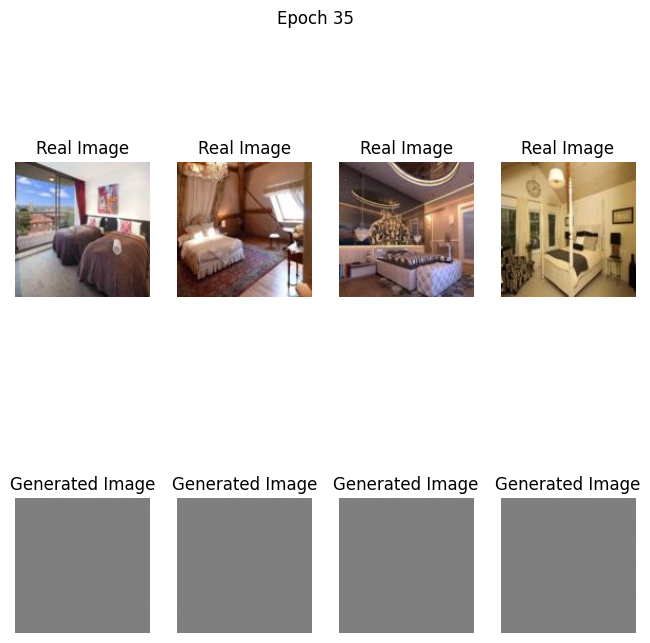

Epoch 37/50, Generator Loss: 3.1582071781158447, Discriminator Loss: 0.2872965335845947
Time for Epoch 37: 214.47 seconds
Estimated time remaining: 46.47 minutes


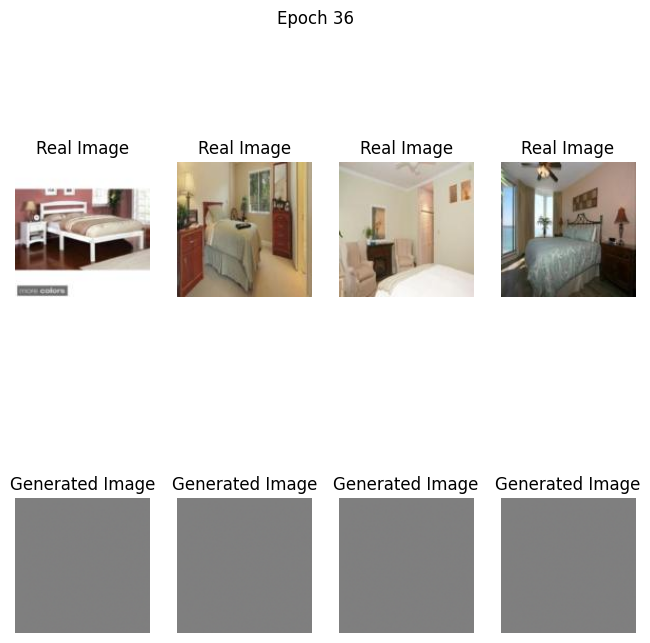

Epoch 38/50, Generator Loss: 3.331369638442993, Discriminator Loss: 0.2501840889453888
Time for Epoch 38: 212.13 seconds
Estimated time remaining: 42.43 minutes


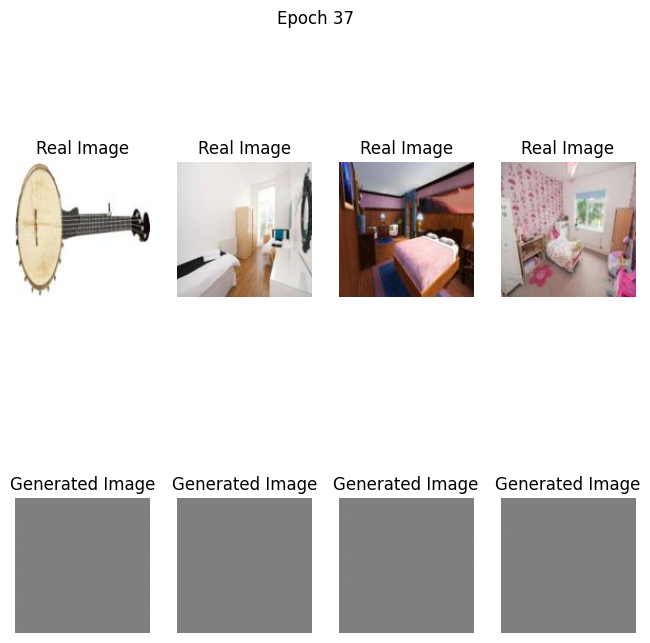

Epoch 39/50, Generator Loss: 4.088308334350586, Discriminator Loss: 0.3091775178909302
Time for Epoch 39: 211.64 seconds
Estimated time remaining: 38.80 minutes


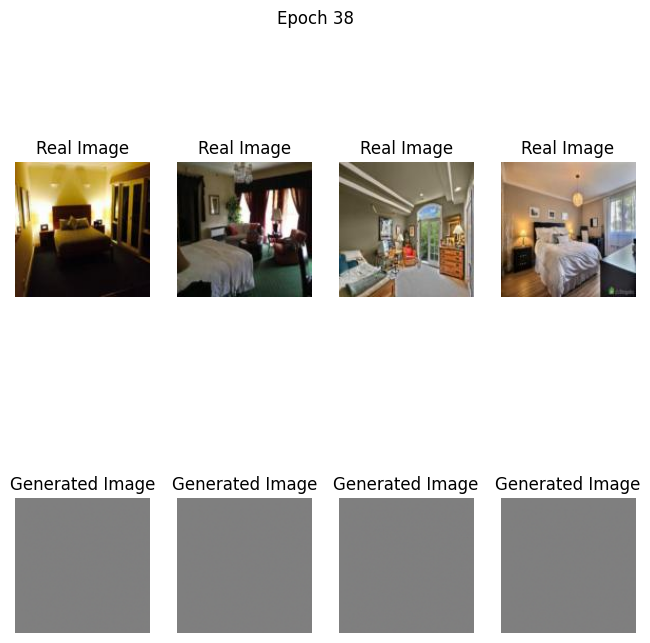

Epoch 40/50, Generator Loss: 4.482298374176025, Discriminator Loss: 0.13710132241249084
Time for Epoch 40: 208.54 seconds
Estimated time remaining: 34.76 minutes


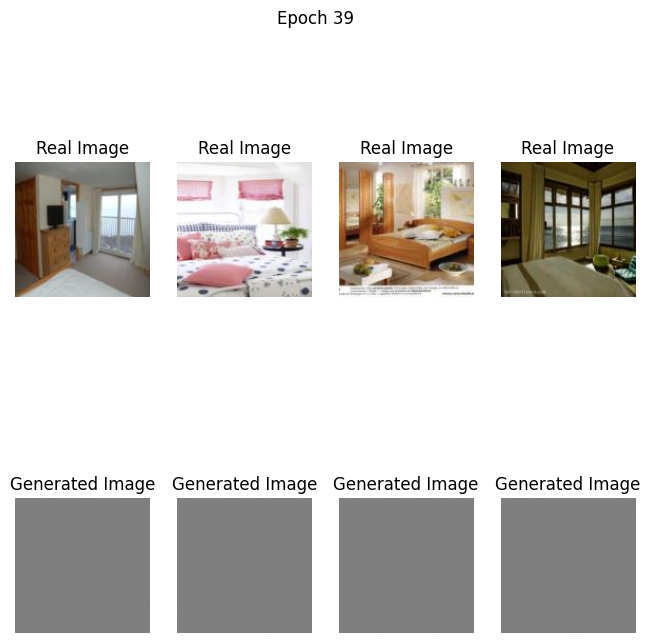

Epoch 41/50, Generator Loss: 3.5381929874420166, Discriminator Loss: 0.21857580542564392
Time for Epoch 41: 209.88 seconds
Estimated time remaining: 31.48 minutes


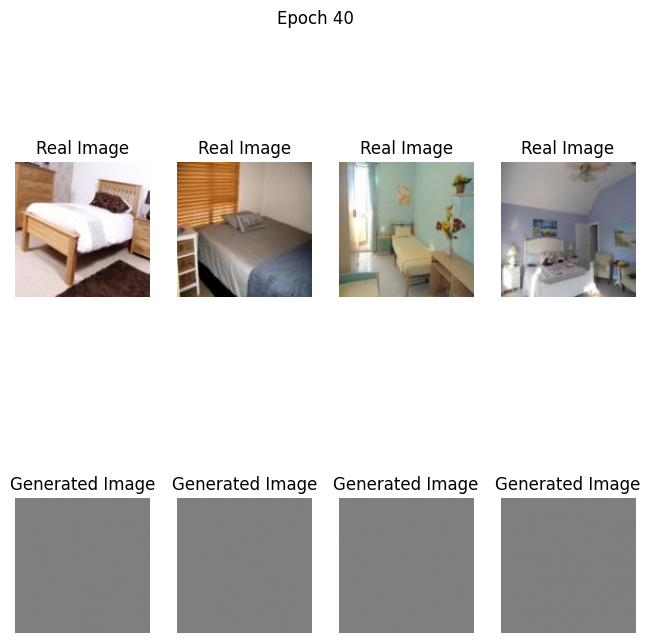

Epoch 42/50, Generator Loss: 4.174135208129883, Discriminator Loss: 0.24398323893547058
Time for Epoch 42: 209.48 seconds
Estimated time remaining: 27.93 minutes


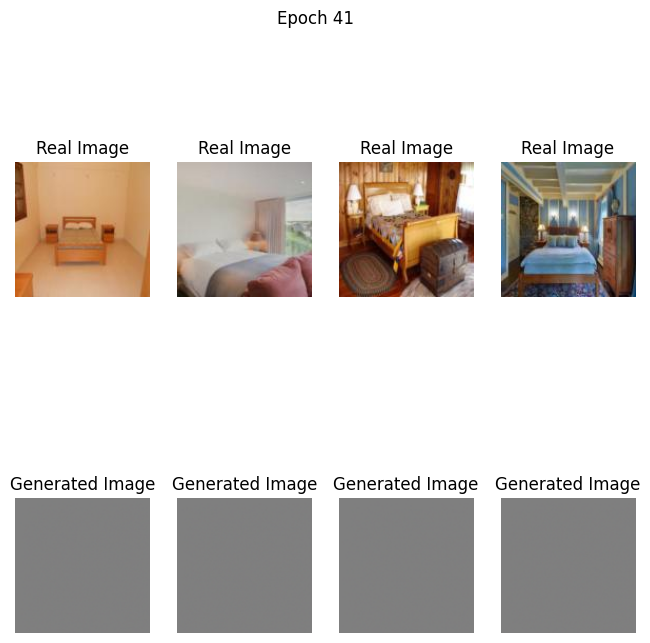

Epoch 43/50, Generator Loss: 4.3060503005981445, Discriminator Loss: 0.05463605374097824
Time for Epoch 43: 210.90 seconds
Estimated time remaining: 24.60 minutes


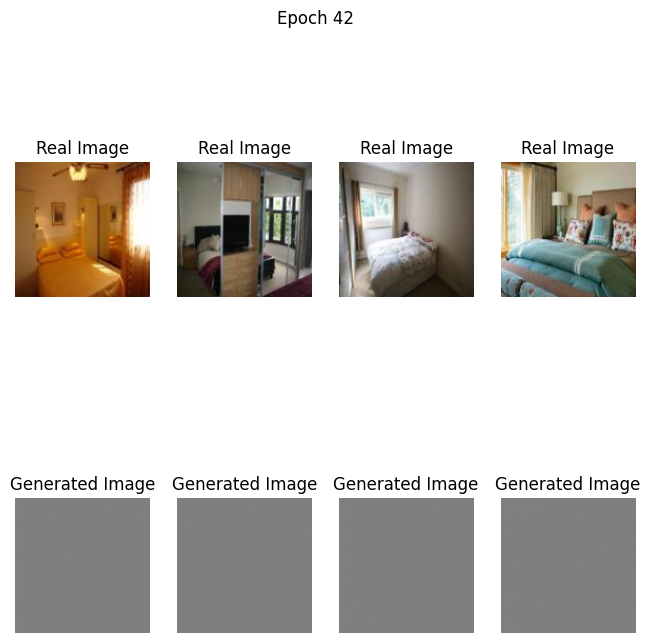

Epoch 44/50, Generator Loss: 4.699322700500488, Discriminator Loss: 0.12554815411567688
Time for Epoch 44: 210.10 seconds
Estimated time remaining: 21.01 minutes


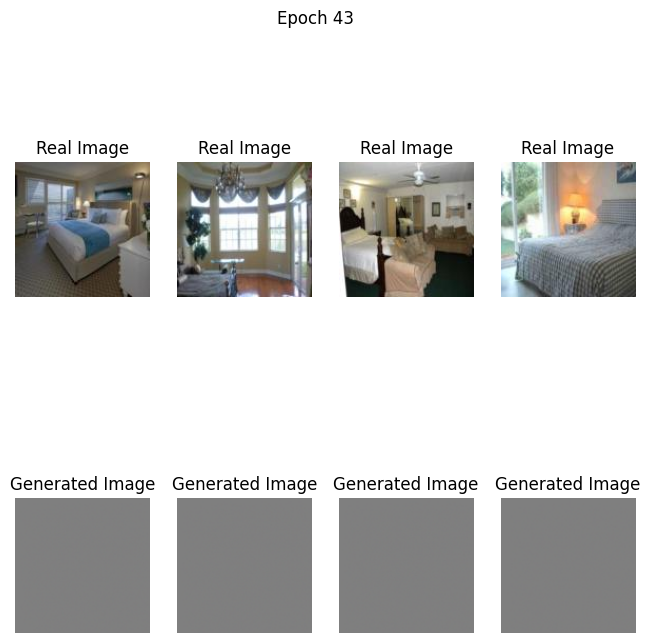

Epoch 45/50, Generator Loss: 3.9086484909057617, Discriminator Loss: 0.4106496572494507
Time for Epoch 45: 212.62 seconds
Estimated time remaining: 17.72 minutes


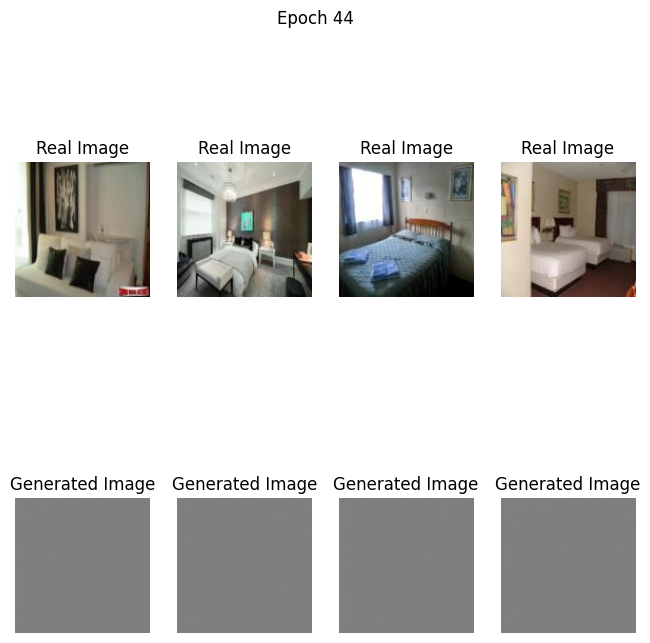

Epoch 46/50, Generator Loss: 3.600954055786133, Discriminator Loss: 0.2546095848083496
Time for Epoch 46: 209.32 seconds
Estimated time remaining: 13.95 minutes


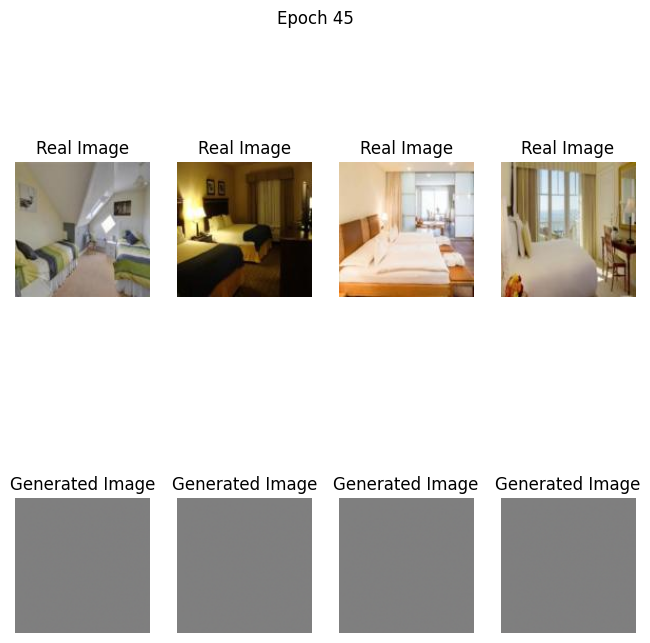

Epoch 47/50, Generator Loss: 3.482884407043457, Discriminator Loss: 0.3413640856742859
Time for Epoch 47: 209.90 seconds
Estimated time remaining: 10.50 minutes


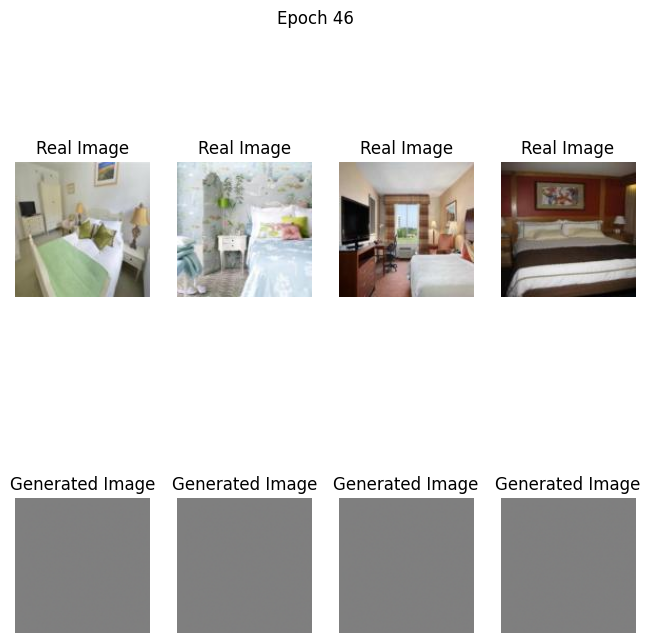

Epoch 48/50, Generator Loss: 3.9270737171173096, Discriminator Loss: 0.24208007752895355
Time for Epoch 48: 208.43 seconds
Estimated time remaining: 6.95 minutes


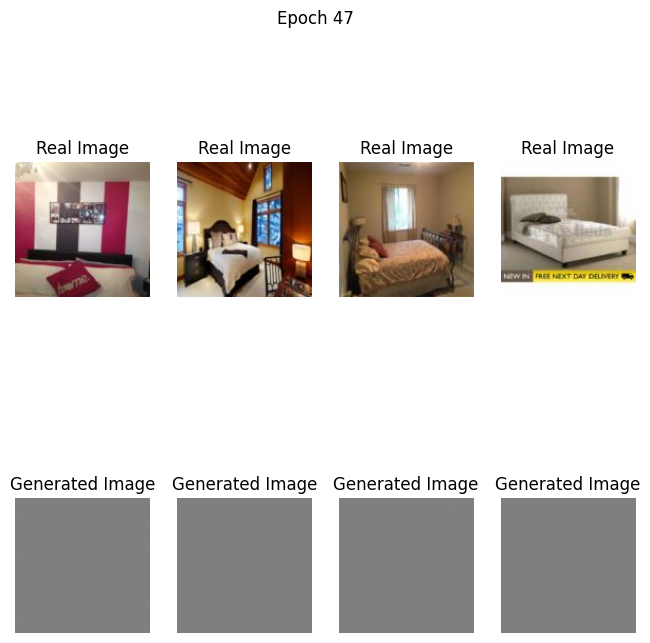

Epoch 49/50, Generator Loss: 4.126938343048096, Discriminator Loss: 0.22424998879432678
Time for Epoch 49: 213.96 seconds
Estimated time remaining: 3.57 minutes


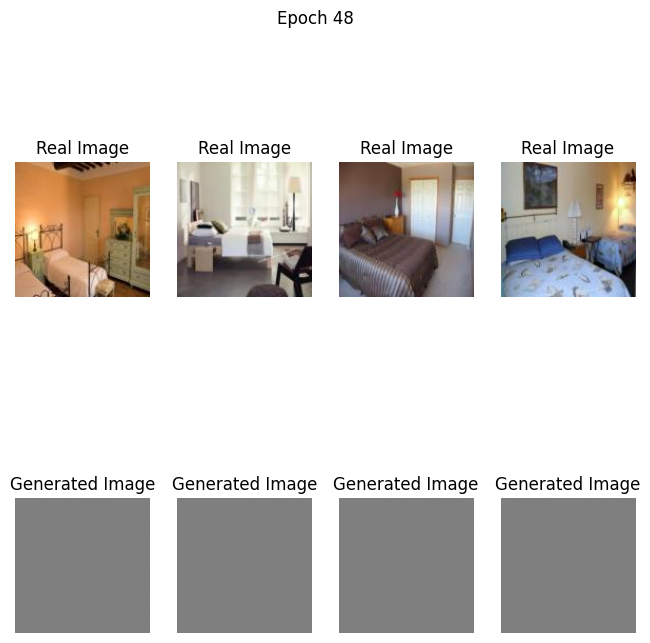

Epoch 50/50, Generator Loss: 3.10068941116333, Discriminator Loss: 0.39783698320388794
Time for Epoch 50: 212.01 seconds
Estimated time remaining: 0.00 minutes


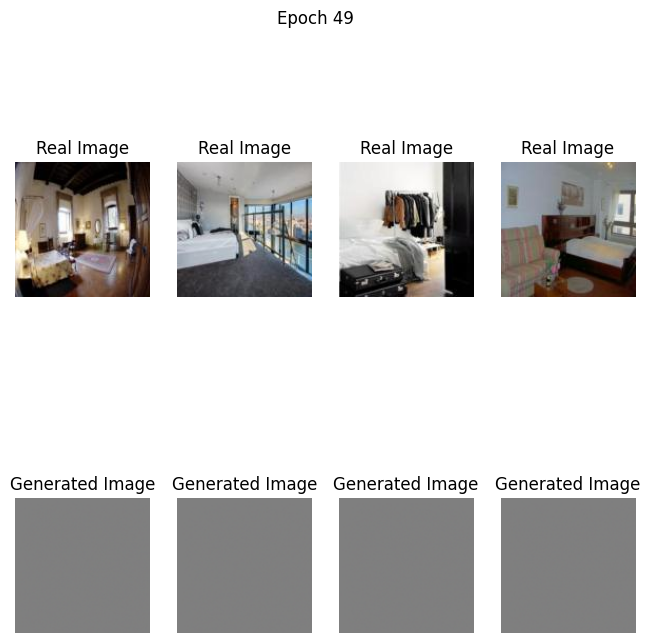

Training completed in: 176.78 minutes


In [75]:

# Training loop
import time

# Assuming 'make_generator_model' and 'make_discriminator_model' are defined elsewhere
# Assuming `preprocess` is defined for preprocessing images

# Function to generate and save images for visualization
def generate_and_save_images(generator, real_images, epoch, test_input):
    predictions = generator(test_input, training=False)

    fig, axes = plt.subplots(2, 4, figsize=(8, 8))

    # Show real images
    for i in range(4):
        img = (real_images[i] * 127.5 + 127.5).numpy().astype("uint8")
        if img.shape[0] == 3:  # Convert to (H, W, C) if channels-first
            img = img.transpose(1, 2, 0)
        axes[0, i].imshow(img)
        axes[0, i].axis("off")
        axes[0, i].set_title("Real Image")

    # Show generated images
    for i in range(4):
        gen_img = (predictions[i] * 127.5 + 127.5).numpy().astype("uint8")
        if gen_img.shape[0] == 3:
            gen_img = gen_img.transpose(1, 2, 0)
        axes[1, i].imshow(gen_img)
        axes[1, i].axis("off")
        axes[1, i].set_title("Generated Image")

    plt.suptitle(f"Epoch {epoch}")
    plt.savefig(f'image_at_epoch_{epoch:04d}.png')
    plt.show()

# Training function with timing and visualization after each epoch
def train(dataset, epochs, generator, discriminator, generator_optimizer, discriminator_optimizer, noise_dim):
    start_time = time.time()  # Start time of training

    for epoch in range(epochs):
        epoch_start = time.time()  # Start time of the current epoch

        for real_images in dataset:
           # Generate noise for this batch
            noise = tf.random.normal([BATCH_SIZE, noise_dim])

            # Call train_step with both real_images and noise
            gen_loss, disc_loss = train_step(real_images, noise)  # Pass noise to train_step

        # End of epoch timing and estimated time remaining calculation
        epoch_end = time.time()
        epoch_duration = epoch_end - epoch_start
        elapsed_time = epoch_end - start_time
        remaining_epochs = epochs - (epoch + 1)
        estimated_remaining_time = remaining_epochs * epoch_duration

        # Print losses, time for current epoch, and estimated time remaining
        print(f"Epoch {epoch + 1}/{epochs}, Generator Loss: {gen_loss}, Discriminator Loss: {disc_loss}")
        print(f"Time for Epoch {epoch + 1}: {epoch_duration:.2f} seconds")
        print(f"Estimated time remaining: {estimated_remaining_time / 60:.2f} minutes")

        # Generate images using a random seed for consistent comparison
        seed = tf.random.normal([4, noise_dim])  # Use 4 generated images for visualization
        generate_and_save_images(generator, real_images, epoch, seed)

    # Total training time
    total_time = time.time() - start_time
    print(f"Training completed in: {total_time / 60:.2f} minutes")

# Dataset setup
image_paths = [os.path.join(output_dir, f) for f in os.listdir(output_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]
dataset = tf.data.Dataset.from_tensor_slices(image_paths)
dataset = dataset.map(lambda x: tf.py_function(load_image, [x], tf.float32), num_parallel_calls=tf.data.AUTOTUNE)

# Specify output shape to ensure TensorFlow knows the dimensions
dataset = dataset.map(lambda x: tf.ensure_shape(x, [128, 128, 3]), num_parallel_calls=tf.data.AUTOTUNE)
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

# Instantiate models and optimizers
generator = make_generator_model()
discriminator = make_discriminator_model()
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)

# Define the noise dimension for generator input
noise_dim = 100  # Adjust this as per generator input requirements

# Start training
train(dataset, EPOCHS, generator, discriminator, generator_optimizer, discriminator_optimizer, noise_dim)



Discussion Questions:
Discuss the trade-off between generating high-quality images and maintaining diversity in the output. Are the generated images too similar, or does the model capture a wide range of bedroom styles?

**Unfortunantely, I was not able to so see my generated images, but I do feel as if it would be tougher to have images generated that are similar.I feel due to the fact that there are so many different images, there is a generous amount of variety when generating images. **

Consider on potential enhancements to the model architecture or training process. Would experimenting with different hyperparameters or batch sizes yield better results?

**I think increasing the batch size would make the training faseter, but it could end up taking up more memory.**
What are the practical applications for this type of generative model?

**This could be used for creating images based off text analysis. It works collectively with the transformers, for example chat GPT.**

**Generate and save images**


## Train the model
Call the `train()` method defined above to train the generator and discriminator simultaneously. Note, training GANs can be tricky. It's important that the generator and discriminator do not overpower each other (e.g., that they train at a similar rate).

At the beginning of the training, the generated images look like random noise. As training progresses, the generated digits will look increasingly real. After about 50 epochs, they resemble MNIST digits. This may take about one minute / epoch with the default settings on Colab.

## Create a GIF


In [76]:
# Display a single image using the epoch number
def display_image(epoch_no):
  return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))

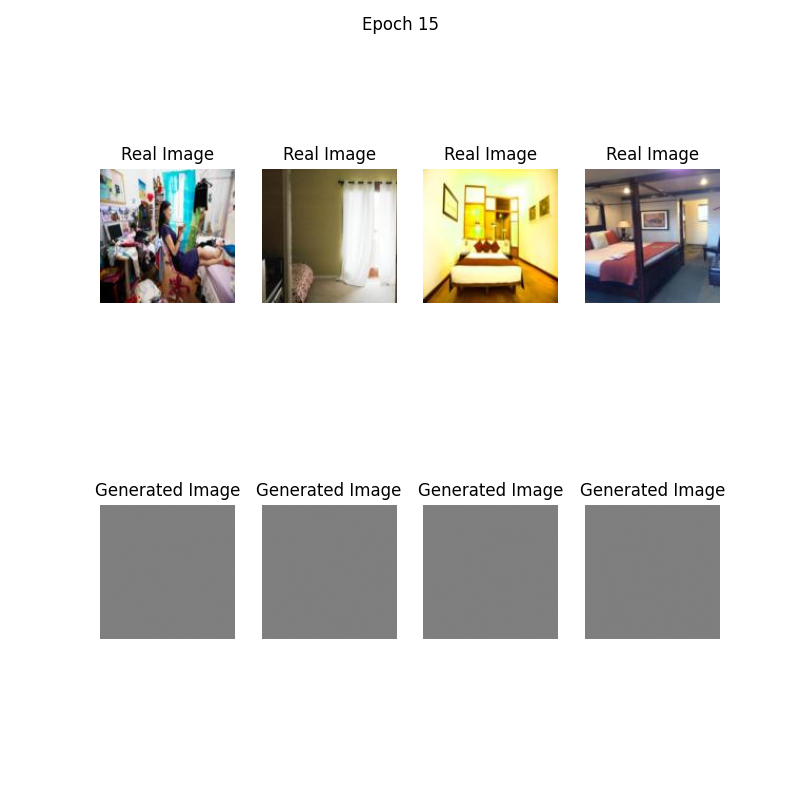

In [79]:
display_image(15)

Use `imageio` to create an animated gif using the images saved during training.